## Import

In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

In [2]:
import sys
sys.path.append('/home/tonnonssi/YOLO-Futures/code')

from env.risk import MarketStateManager

## Dataset

In [3]:
with open('../data/processed/kospi200_ffill_clean_version.pkl', 'rb') as f:
    df = pickle.load(f)

print(df.shape)
df.head(5)

(941402, 8)


,date,time,open,high,low,close,prevClose,vol
2010-02-16 09:01:00,20100216,901,207.55,207.65,207.50,207.60,207.5,3985.0
2010-02-16 09:02:00,20100216,902,207.60,207.65,207.25,207.55,207.5,5095.0
2010-02-16 09:03:00,20100216,903,207.55,207.80,207.50,207.60,207.5,2175.0
2010-02-16 09:04:00,20100216,904,207.55,207.85,207.55,207.80,207.5,1301.0
2010-02-16 09:05:00,20100216,905,207.80,208.15,207.80,208.05,207.5,3870.0


In [ ]:
def check_market_status(long_term):

    recent_minima = min(long_term)
    recent_maxima = max(long_term)

    latest_data = long_term[-1]

    if latest_data >= recent_minima * 1.2:
        return 'BULL'
    elif latest_data <= recent_maxima * 0.8:
        return 'BEAR'
    else:
        return 'SIDEWAYS'

In [9]:
# 2개월치 분봉 데이터의 개수 (예: 390분 × 20영업일 × 2개월)
WINDOW_SIZE = 15600  # 필요시 정확하게 계산

df['min_close'] = df['close'].rolling(window=WINDOW_SIZE, min_periods=10).min()
df['max_close'] = df['close'].rolling(window=WINDOW_SIZE, min_periods=10).max()

def fast_check(row):
    if pd.isna(row['min_close']) or pd.isna(row['max_close']):
        return 'SIDEWAYS'
    latest = row['close']
    if latest >= row['min_close'] * 1.2:
        return 'BULL'
    elif latest <= row['max_close'] * 0.8:
        return 'BEAR'
    else:
        return 'SIDEWAYS'

df['market_status'] = df.apply(fast_check, axis=1)

In [14]:
def plot_monthly_market_fixed(df, target='market_status'):
    monthly_groups = df.resample('1M')  # 2주 단위 그룹화
    for period_start, group in monthly_groups:
        if group.empty:
            continue

        # 연속 인덱스 확보
        group = group.copy()
        group['x'] = np.arange(len(group))

        fig, ax = plt.subplots(figsize=(14, 4))
        ax.plot(group['x'], group['close'], label='Close', color='black', linewidth=1)

        for status in ['BULL', 'BEAR', 'SIDEWAYS']:
            mask = group[target] == status
            ax.fill_between(
                group['x'],
                group['close'].min(),
                group['close'].max(),
                where=mask,
                alpha=0.15,
                color={'BULL': 'green', 'BEAR': 'red', 'SIDEWAYS': 'gray'}[status],
                label=status if mask.any() else None
            )

        # x축을 날짜로 표시
        xticks = np.linspace(0, len(group) - 1, 10).astype(int)
        ax.set_xticks(xticks)
        ax.set_xticklabels(group.index[xticks].strftime('%m-%d'), rotation=45)

        # 제목 표시
        start_date = group.index[0].strftime('%Y-%m-%d')
        end_date = group.index[-1].strftime('%Y-%m-%d')
        ax.set_title(f"{target}: {start_date} ~ {end_date}")
        ax.legend()
        plt.tight_layout()
        plt.show()

# plot_monthly_market_fixed(df)

In [ ]:
def plot_status_heatmap(df):
    df_temp = df.copy()
    df_temp['year_month'] = df_temp.index.to_period('M').astype(str)
    pivot = df_temp.groupby(['year_month', 'market_status'])['close'].mean().unstack()

    plt.figure(figsize=(14, 6))
    sns.heatmap(pivot.T, cmap='coolwarm', annot=False, fmt=".1f", linewidths=0.5)
    plt.title('Average Close Price by Market Status (per Month)')
    plt.xlabel('Year-Month')
    plt.ylabel('Market Status')
    plt.tight_layout()
    plt.show()

plot_status_heatmap(df)

In [4]:
def fast_compute_trend_regime(df: pd.DataFrame) -> pd.DataFrame:
    """
    매우 빠르게 BULL/BEAR/SIDEWAYS 상태를 계산
    """
    close = df['close'].values

    # 벡터화된 이동 평균 계산
    short_ma = pd.Series(close).rolling(window=5, min_periods=5).mean().to_numpy()
    long_ma = pd.Series(close).rolling(window=80, min_periods=80).mean().to_numpy()

    # 상태 판별 (벡터 연산)
    trend_regime = np.full(len(close), 'SIDEWAYS', dtype=object)
    valid_mask = ~np.isnan(short_ma) & ~np.isnan(long_ma)

    bull_mask = (short_ma >= long_ma * 1.003) & valid_mask
    bear_mask = (short_ma <= long_ma * 0.997) & valid_mask

    trend_regime[bull_mask] = 'BULL'
    trend_regime[bear_mask] = 'BEAR'

    df['trend_regime'] = trend_regime
    return df

In [5]:
fast_compute_trend_regime(df)

,date,time,open,high,low,close,prevClose,vol,trend_regime
2010-02-16 09:01:00,20100216,901,207.55,207.65,207.50,207.60,207.5,3985.0,SIDEWAYS
2010-02-16 09:02:00,20100216,902,207.60,207.65,207.25,207.55,207.5,5095.0,SIDEWAYS
2010-02-16 09:03:00,20100216,903,207.55,207.80,207.50,207.60,207.5,2175.0,SIDEWAYS
2010-02-16 09:04:00,20100216,904,207.55,207.85,207.55,207.80,207.5,1301.0,SIDEWAYS
2010-02-16 09:05:00,20100216,905,207.80,208.15,207.80,208.05,207.5,3870.0,SIDEWAYS
...,...,...,...,...,...,...,...,...,...
2020-03-19 15:32:00,20200319,1532,197.90,198.75,197.80,198.55,211.6,2947.0,BEAR
2020-03-19 15:33:00,20200319,1533,198.50,198.80,197.70,197.70,211.6,3289.0,BEAR
2020-03-19 15:34:00,20200319,1534,197.70,198.05,197.60,197.85,211.6,2635.0,BEAR
2020-03-19 15:35:00,20200319,1535,197.85,198.70,197.50,197.50,211.6,3325.0,BEAR


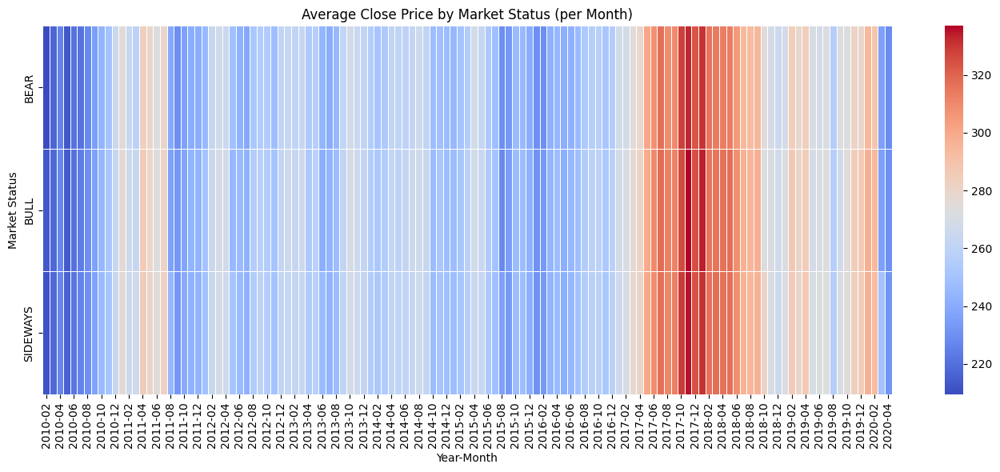

In [8]:
def plot_status_heatmap(df):
    df_temp = df.copy()
    df_temp['year_month'] = df_temp.index.to_period('M').astype(str)
    pivot = df_temp.groupby(['year_month', 'trend_regime'])['close'].mean().unstack()

    plt.figure(figsize=(14, 6))
    sns.heatmap(pivot.T, cmap='coolwarm', annot=False, fmt=".1f", linewidths=0.5)
    plt.title('Average Close Price by Market Status (per Month)')
    plt.xlabel('Year-Month')
    plt.ylabel('Market Status')
    plt.tight_layout()
    plt.show()

plot_status_heatmap(df)

In [ ]:
def plot_monthly_market(df):
    monthly_groups = df.resample('M')
    for month, group in monthly_groups:
        if group.empty:
            continue

        fig, ax = plt.subplots(figsize=(14, 4))
        ax.plot(group.index, group['close'], label='Close', color='black', linewidth=1)

        for status in ['BULL', 'BEAR', 'SIDEWAYS']:
            mask = group['trend_regime'] == status
            ax.fill_between(group.index, group['close'].min(), group['close'].max(), 
                            where=mask, alpha=0.15,
                            color={'BULL':'green','BEAR':'red','SIDEWAYS':'gray'}[status],
                            label=status if mask.any() else None)

        ax.set_title(f'Market Status in {month.strftime("%Y-%m")}')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%d'))
        ax.legend()
        plt.tight_layout()
        plt.show()

plot_monthly_market(df)

/tmp/ipykernel_75043/1850763275.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_groups = df.resample('1M')  # 2주 단위 그룹화


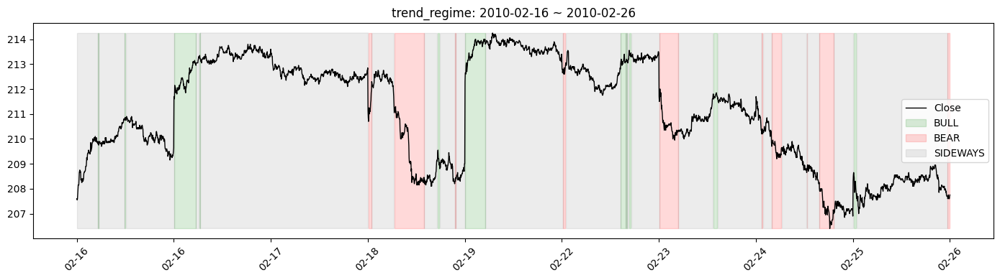

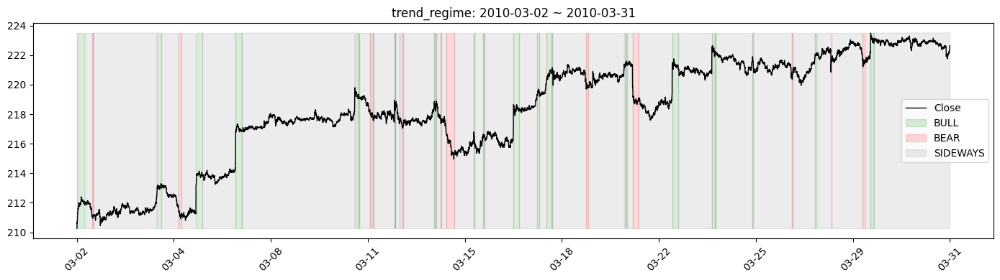

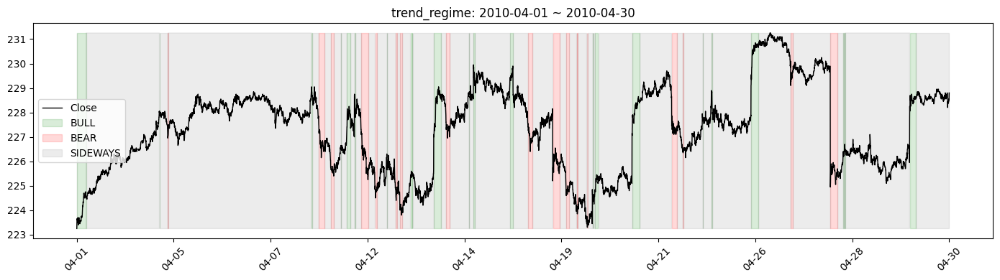

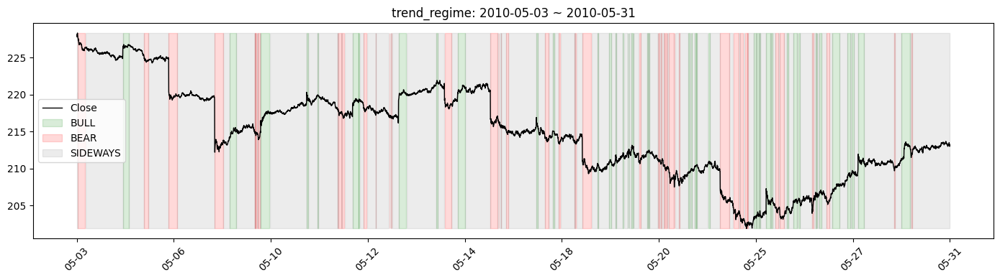

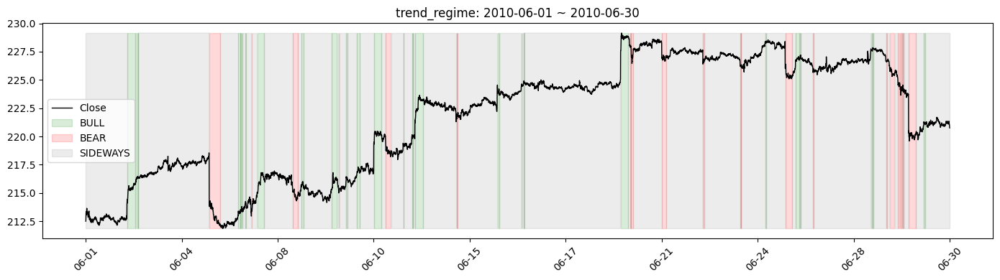

...

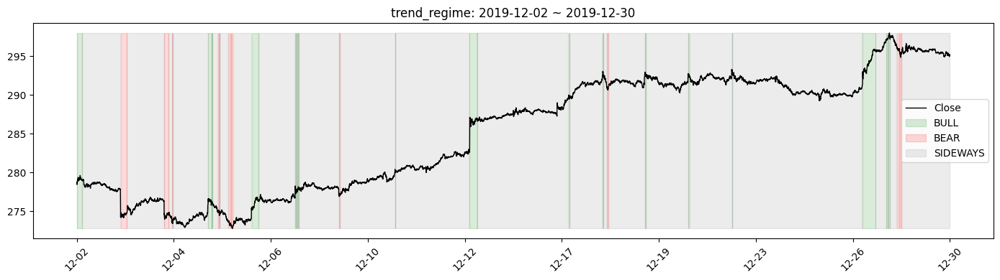

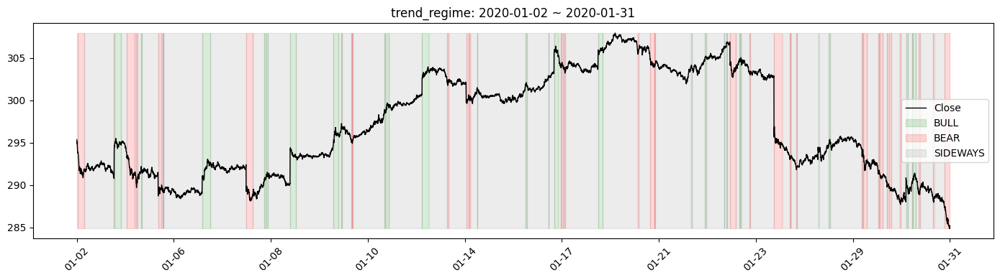

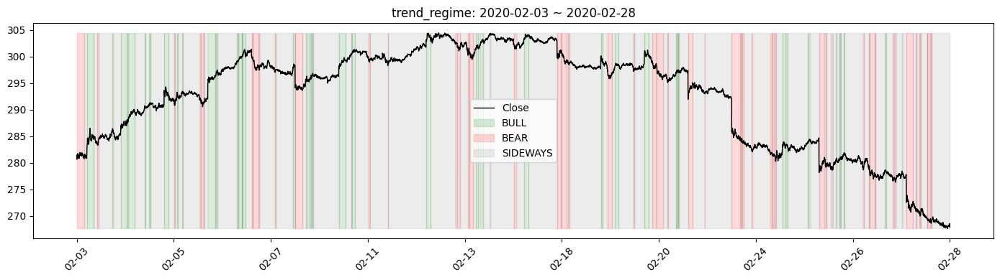

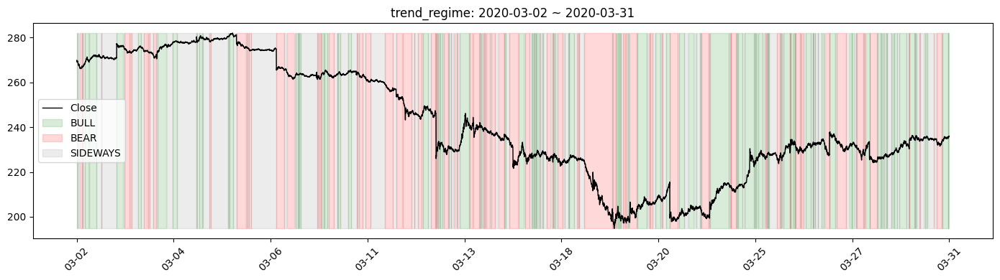

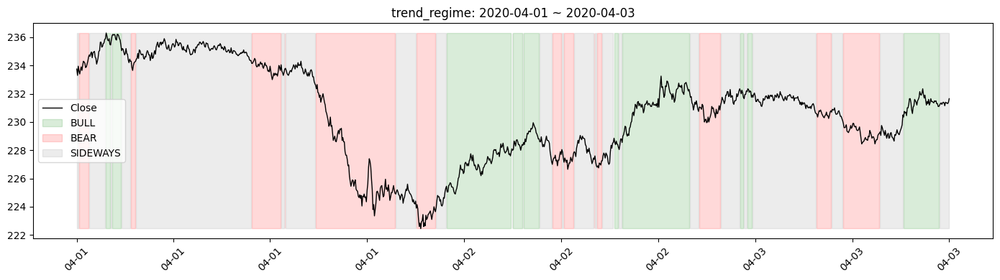

In [15]:
plot_monthly_market_fixed(df, target='trend_regime')